# **HW 1: Credit Card Churn Prediction**
<hr>

<u>**Members**</u><br>
Tharnarch Thoranisttakul 63340500025<br>
Athimet Aiewcharoen 63340500068
<hr>

## **Function and Import Necessary Libraries**

In [218]:

import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings

from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix, classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder , RobustScaler

# ignore warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import RepeatedKFold, StratifiedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

from sklearn.model_selection import GridSearchCV

from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

from sklearn.metrics import precision_recall_curve
from sklearn import metrics

In [219]:
def diagnostic_plots(df, variable:str):
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].plot.hist()

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)

    plt.show()  

In [220]:
def checkCorrFF(df):
    plt.figure(figsize=(20,10))
    cor = df.corr()
    # mask = np.zeros_like(cor, dtype=np.bool)
    # mask[np.triu_indices_from(mask)] = True
    sns.heatmap(cor, annot=True, cmap='inferno')
    plt.show()

In [221]:
def checkCorrFT(df, target):
    sns.pairplot(df, hue = target)

In [222]:
def checkOutput(df, col:str, colTarget:str, output:str):
    checkdf = df.loc[df[col] == colTarget]
    return checkdf[output].value_counts()

In [223]:
def IQRdrop(df, col:str):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    df = df.loc[(df[col] >= Q1 - 1.5*IQR) & (df[col] <= Q3 + 1.5*IQR)]
    return df

In [224]:
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

## **Data Exploration**

There are a total of 23 features in this dataset which are:

|Feature Name|Description|Data Type|
|-|-|-|
|<font color='green'>CLIENTNUM</font>|Unique identifier for the customer holding the account|
|<font color='green'>Attrition_Flag</font>|Internal event (customer activity) variable (Existing = 1, Attrited = 0)|<font color='red'>Categorical</font> [Output]|
|<font color='green'>Customer_Age</font>|Customer's Age in Years|<font color='red'>Numerical</font>|
|<font color='green'>Gender</font>|(M = Male, F = Female)|<font color='red'>Categorical</font>|
|<font color='green'>Dependent_Count</font>|Number of dependents|<font color='red'>Numerical</font>|
|<font color='green'>Education_Level</font>|Educational Qualification of the account holder (Uneducated, High School, College, Graduate, Post-Graduate, Doctorate, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Marital_Status</font>|(Married, Single, Divorced, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Income_Category</font>|Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, >$120K)|<font color='red'>Categorical</font>|
|<font color='green'>Card_Category</font>|Type of Card (Blue, Silver, Gold, Platinum)</font>|<font color='red'>Categorical</font>|
|<font color='green'>Months_on_book</font>|Period of relationship with bank|<font color='red'>Numerical</font>|
|<font color='green'>Total_Relationship_Count</font>|Total no. of products held by the customer|<font color='red'>Numerical</font>|
|<font color='green'>Months_Inactive_12_mon</font>|No. of months inactive in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Contacts_Count_12_mon</font>|No. of Contacts in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Credit_Limit</font>|Credit Limit on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Total_Revolving_Bal</font>|Total Revolving Balance on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Open_To_Buy</font>|Open to Buy Credit Line (Average of last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Amt_Chng_Q4_Q1</font>|Change in Transaction Amount (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Amt</font>|Total Transaction Amount (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Ct</font>|Total Transaction Count (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Ct_Chng_Q4_Q1</font>|Change in Transaction Count (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Utilization_Ratio</font>|Average Card Utilization Ratio|<font color='red'>Numerical</font>|
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||

### **Import Dataset**

In [225]:
dfOri = df = pd.read_csv('HWdata/credit_card_churn.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [226]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [227]:
df.shape

(10127, 23)

We can see that this dataset has 23 features and 10127 data.

In [228]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [229]:
df.dtypes

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

### **Drop Unnecessary Features**

Since '<font color='orange'>CLIENTNUM</font>' is a unique classifier for each customer, we will drop this feature.
The last 2 features, '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1</font>' and '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2</font>', are for Naive Bayes Classifier, which we won't be using in this assignment, we will also drop these features.


In [230]:
df.drop(
['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], 
axis=1, inplace=True)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [231]:
df.shape

(10127, 20)

In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

After dropping the unnecessary features, we are left with 20 features.

In which, there are:

- 6 features that are '<font color='green'>object</font>', which means that they are '<font color='red'>Categorical Features</font>'.
- 14 features that are '<font color='green'>int64</font>' and '<font color='green'>float64</font>', which means that they are '<font color='red'>Numerical Features</font>'

### **Sort Features**
**Order:**
1. Numerical Features
2. Categorical Features
3. Output

**Separate Numerical Features from Dataset**

In [233]:
dfNum = df.select_dtypes(include=['int64', 'float64'])

**Separate Categorical Features from Dataset**

In [234]:
dfCate = df.select_dtypes(include=['object'])
dfCate = dfCate.iloc[:,1:]

**Separate Output from Dataset**

In [235]:
dfOut = df.iloc[:,0:1]

**Concatenate Separated Data**

In [236]:
df = pd.concat([dfNum, dfCate, dfOut], axis=1)
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer' : 1,'Attrited Customer': 0})
df

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,M,Graduate,Single,$40K - $60K,Blue,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


### **Model Training w/o Data Preprocessing**

In [237]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

#get the dummy variables for the categorical variables
dfbm = pd.get_dummies(df)

xbm = dfbm.drop(['Attrition_Flag'], axis = 1)
ybm = dfbm['Attrition_Flag']

xbm_train,xbm_test,ybm_train,ybm_test = train_test_split(xbm,ybm,test_size = 0.2,random_state = 0)

clfbm = LogisticRegression()
clfbm.fit(xbm_train,ybm_train)
print("model score: %.8f" % clfbm.score(xbm_test, ybm_test))

model score: 0.89338598


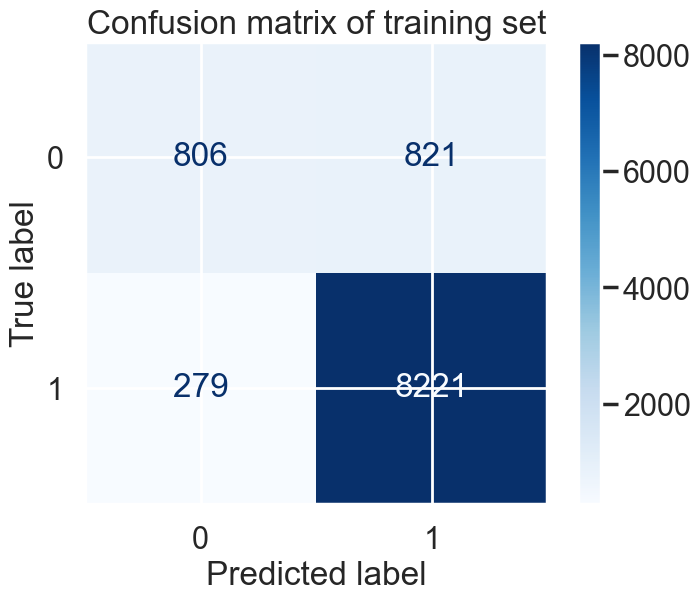

In [238]:
# Plot confusion matrix of training set
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clfbm,
                      xbm,
                      ybm,
                      display_labels=list(set(ybm_test)),
                      cmap=plt.cm.Blues) 
plt.title('Confusion matrix of training set')
plt.show()  

In [239]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_train = clfbm.predict(xbm_train)
print("Classification report on Train data\n=======================")
print(classification_report(y_true=ybm_train, y_pred=ybm_pred_train))
print("Confusion matrix on Train data\n=======================")

print(confusion_matrix(y_true=ybm_train, y_pred=ybm_pred_train))

Classification report on Train data
              precision    recall  f1-score   support

           0       0.75      0.50      0.60      1318
           1       0.91      0.97      0.94      6783

    accuracy                           0.89      8101
   macro avg       0.83      0.73      0.77      8101
weighted avg       0.88      0.89      0.88      8101

Confusion matrix on Train data
[[ 654  664]
 [ 220 6563]]


In [240]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_test = clfbm.predict(xbm_test)
print("Classification report on Test data\n=======================")
print(classification_report(y_true=ybm_test, y_pred=ybm_pred_test))
print("Confusion matrix on Test data\n=======================")

print(confusion_matrix(y_true=ybm_test, y_pred=ybm_pred_test))

Classification report on Test data
              precision    recall  f1-score   support

           0       0.72      0.49      0.58       309
           1       0.91      0.97      0.94      1717

    accuracy                           0.89      2026
   macro avg       0.82      0.73      0.76      2026
weighted avg       0.88      0.89      0.88      2026

Confusion matrix on Test data
[[ 152  157]
 [  59 1658]]


### **Check Values of Numerical Features**

In [241]:
df.isnull().sum()

Customer_Age                0
Dependent_count             0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Gender                      0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Attrition_Flag              0
dtype: int64

In [242]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


<AxesSubplot:xlabel='Avg_Utilization_Ratio', ylabel='Count'>

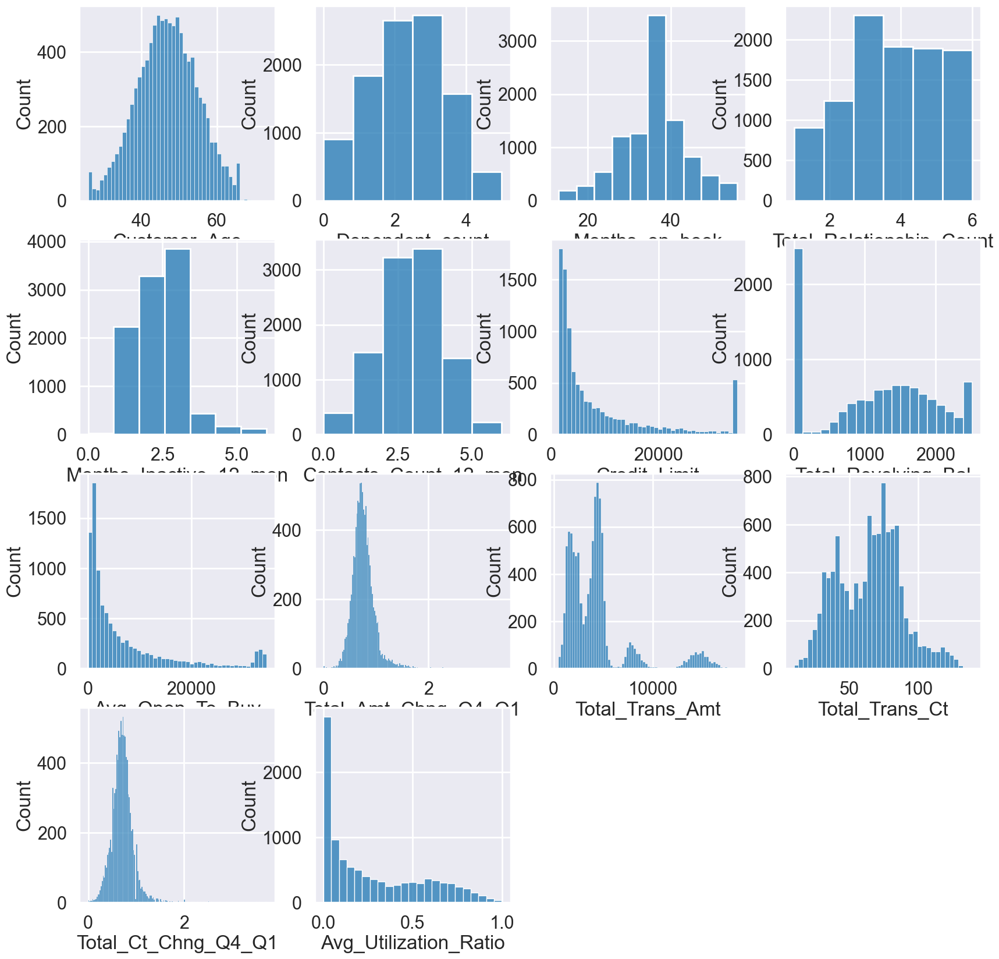

In [243]:
# plot numerical data
plt.figure(figsize=(20,20))
plt.subplot(441) 
sns.histplot(df['Customer_Age'])
plt.subplot(442) 
sns.histplot(df['Dependent_count'],bins=6)
plt.subplot(443) 
sns.histplot(df['Months_on_book'],bins=10)
plt.subplot(444) 
sns.histplot(df['Total_Relationship_Count'],bins=6)
plt.subplot(445) 
sns.histplot(df['Months_Inactive_12_mon'],bins=7)
plt.subplot(446) 
sns.histplot(df['Contacts_Count_12_mon'],bins=6)
plt.subplot(447) 
sns.histplot(df['Credit_Limit'])
plt.subplot(448) 
sns.histplot(df['Total_Revolving_Bal'])
plt.subplot(449) 
sns.histplot(df['Avg_Open_To_Buy'])
plt.subplot(4,4,10) 
sns.histplot(df['Total_Amt_Chng_Q4_Q1'])
plt.subplot(4,4,11)
sns.histplot(df['Total_Trans_Amt'])
plt.subplot(4,4,12)
sns.histplot(df['Total_Trans_Ct'])
plt.subplot(4,4,13)
sns.histplot(df['Total_Ct_Chng_Q4_Q1'])
plt.subplot(4,4,14)
sns.histplot(df['Avg_Utilization_Ratio'])

What we got from plotting values of numerical features:

|Feature Names|Normally Distributed|
|-|-|
|Customer_Age|Yes|
|Dependent_Count|Yes|
|Months_on_book|Yes|
|Total_Relationship_Count|No|
|Months_Inactive_12_mon|Almost|
|Contacts_Count_12_mon|Yes|
|Credit_Limit|No|
|Total_Revolving_Bal|No|
|Avg_Open_To_Buy|No|
|Total_Amt_Chng_Q4_Q1|Almost|
|Total_Trans_Amt|No|
|Total_Trans_Ct|Almost|
|Total_Ct_Chng_Q4_Q1|Almost|
|Avg_Utilization_Ratio|No|

### **Check Values of Categorical Features**

In [244]:
df['Gender'].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [245]:
# Calculate Percentage of Gender
100*df['Gender'].value_counts()/len(df)

F    52.908068
M    47.091932
Name: Gender, dtype: float64

In [246]:
df['Education_Level'].value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [247]:
# Calculate Percentage of Education Level
100*df['Education_Level'].value_counts()/len(df)

Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: Education_Level, dtype: float64

In [248]:
df['Marital_Status'].value_counts()

Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64

In [249]:
# Calculate Percentage of Marital Status
100*df['Marital_Status'].value_counts()/len(df)

Married     46.282216
Single      38.935519
Unknown      7.396070
Divorced     7.386195
Name: Marital_Status, dtype: float64

In [250]:
df['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [251]:
# Calculate Percentage of Income Category
100*df['Income_Category'].value_counts()/len(df)

Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
Unknown           10.980547
$120K +            7.178829
Name: Income_Category, dtype: float64

In [252]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [253]:
# Calculate Percentage of Card Category
100*df['Card_Category'].value_counts()/len(df)

Blue        93.176656
Silver       5.480399
Gold         1.145453
Platinum     0.197492
Name: Card_Category, dtype: float64

<AxesSubplot:title={'center':'Card Category'}>

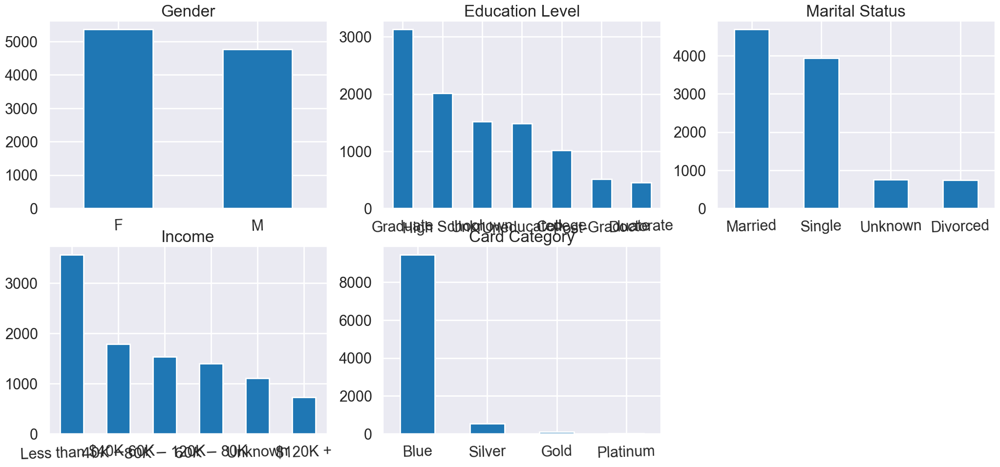

In [254]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
df['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
df['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
df['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
df['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
df['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

What we got from plotting values of categorical features:

|Feature Names|What we got|
|-|-|
|Gender|There are nearly the same amount of male and female.|
|Education_Level|Most of the people in this dataset are 'Graduate' and around 15% of the people are 'Unknown'|
|Marital_Status|46% of this data are 'Married', 39% are 'Single' and the rest are 'Unknown' or 'Divorced'|
|Income_Category|Most people in this dataset have 'less than 40K' income|
|Card_Category|People in this dataset mostly hold blue cards (more than 93%) and the rest hold the other 3 cards (less than 7%).|

### **Check Behaviour of Attrition_Flag**

In [255]:
dfAtt = df[df['Attrition_Flag'] == 0]
dfAtt

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
21,62,0,49,2,3,3,1438.3,0,1438.3,1.047,692,16,0.600,0.000,F,Graduate,Married,Less than $40K,Blue,0
39,66,0,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077,F,Doctorate,Married,Unknown,Blue,0
51,54,1,40,2,3,1,1438.3,808,630.3,0.997,705,19,0.900,0.562,F,Graduate,Married,Less than $40K,Blue,0
54,56,2,36,1,3,3,15769.0,0,15769.0,1.041,602,15,0.364,0.000,M,Graduate,Married,$120K +,Blue,0
61,48,2,35,2,4,4,34516.0,0,34516.0,0.763,691,15,0.500,0.000,M,Graduate,Married,$60K - $80K,Silver,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10119,55,3,47,4,3,3,14657.0,2517,12140.0,0.166,6009,53,0.514,0.172,F,Uneducated,Single,Unknown,Blue,0
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


In [256]:
dfExist = df[df['Attrition_Flag'] == 1]
dfExist

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10116,46,5,36,1,2,3,13187.0,2241,10946.0,0.689,15354,112,0.931,0.170,M,College,Single,$80K - $120K,Blue,1
10117,57,2,40,6,3,4,17925.0,1909,16016.0,0.712,17498,111,0.820,0.106,M,Graduate,Married,$80K - $120K,Blue,1
10120,54,1,34,5,2,0,13940.0,2109,11831.0,0.660,15577,114,0.754,0.151,M,High School,Single,$60K - $80K,Blue,1
10121,56,1,50,4,1,4,3688.0,606,3082.0,0.570,14596,120,0.791,0.164,F,Graduate,Single,Less than $40K,Blue,1


### **Plot Features of Attrited Customers**

<AxesSubplot:title={'center':'Card Category'}>

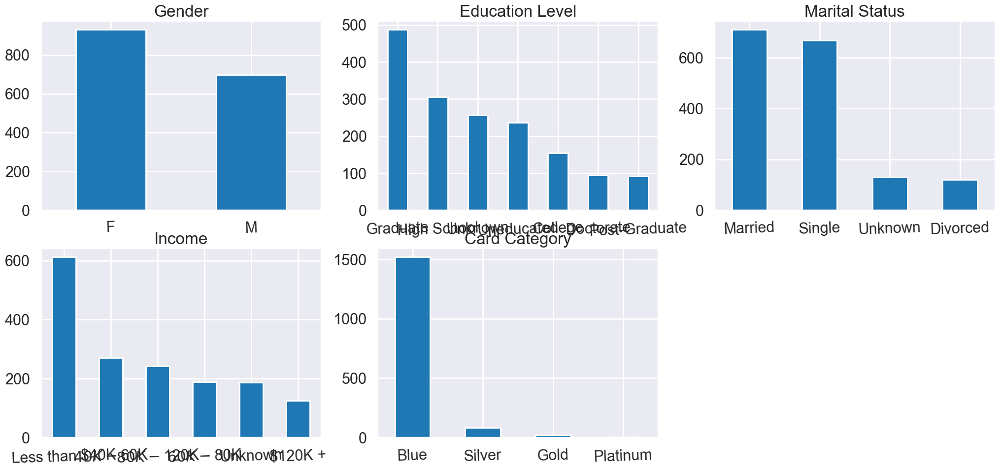

In [257]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfAtt['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfAtt['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfAtt['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfAtt['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfAtt['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

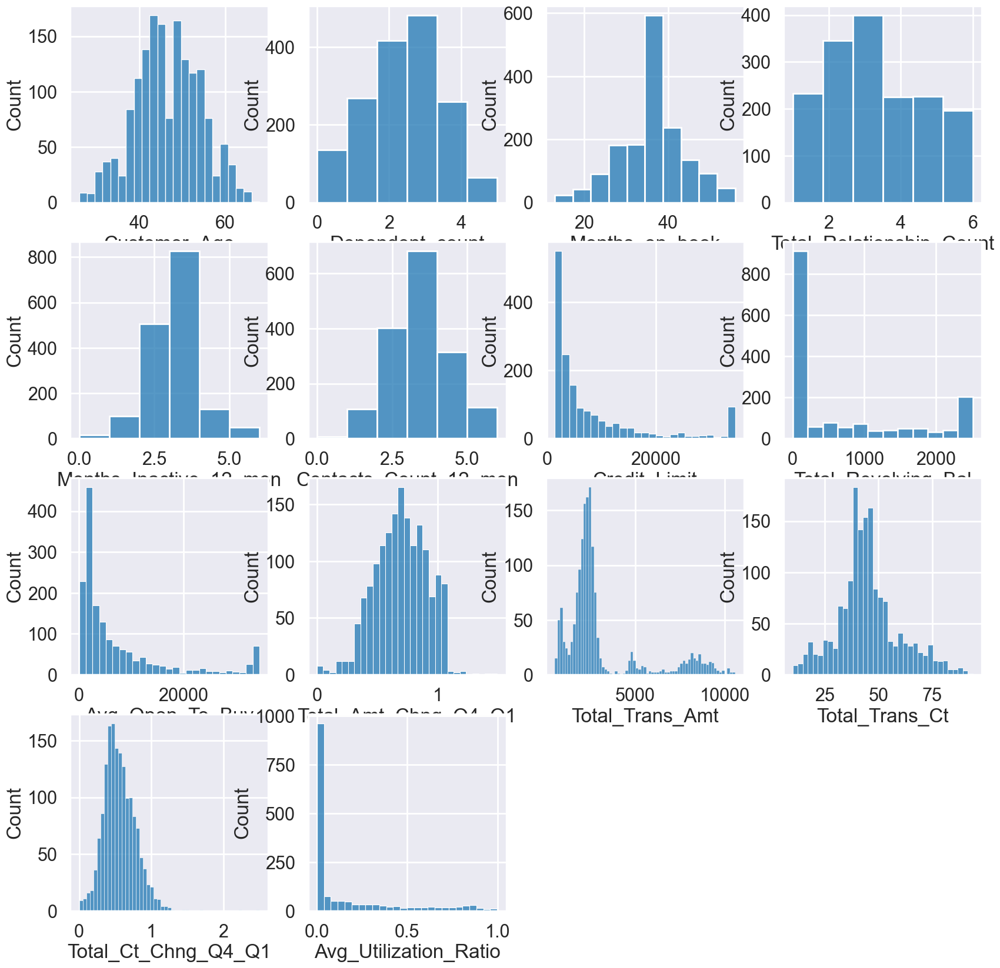

In [258]:
# plot numerical data
plt.figure(figsize=(20,20))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfAtt[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfAtt[col],bins=10)
        else:
            sns.histplot(dfAtt[col])

### **Plot Features of Existing Customers**

<AxesSubplot:title={'center':'Card Category'}>

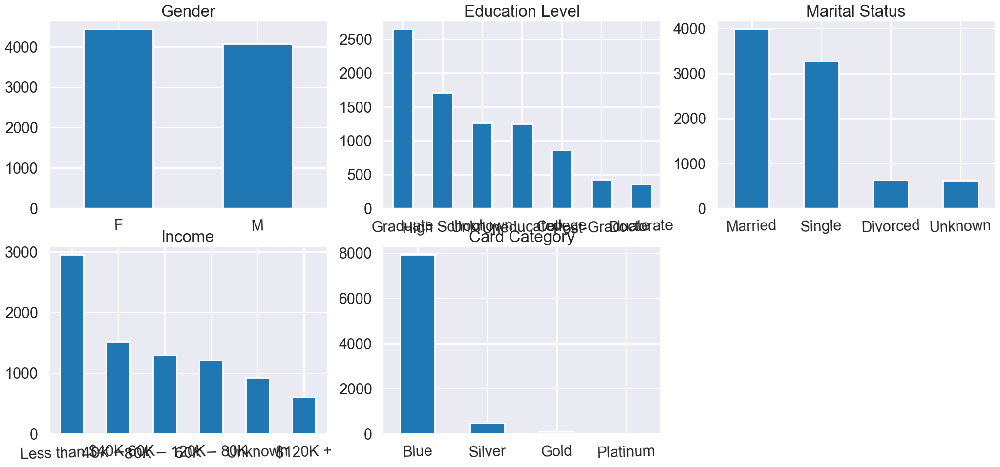

In [259]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfExist['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfExist['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfExist['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfExist['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfExist['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

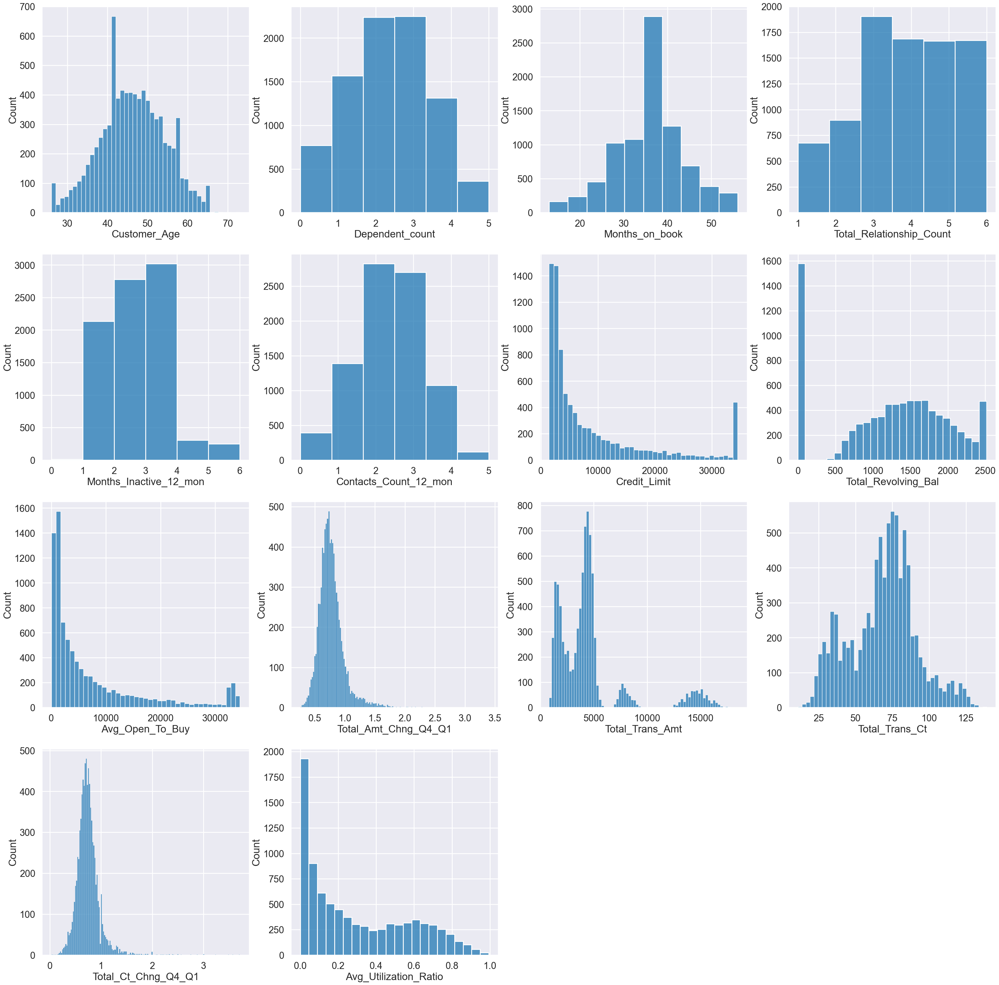

In [260]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfExist[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfExist[col],bins=10)
        else:
            sns.histplot(dfExist[col])

### **Pairplot Interesting Features**

In [261]:
# sns.pairplot(df[['Attrition_Flag','Total_Relationship_Count', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1','Avg_Utilization_Ratio']], diag_kind="hist", hue="Attrition_Flag")

Good and Bad things of this dataset:

|Good Things|Explanation|
|-|-|
|Data Distribution|Most Numerical data are normally distributed.|
|Filled Data in Numerical Features|There are no missing data (NaN) or unknown in numerical features of this dataset.|

<hr>

|Bad Things|Explanation|
|-|-|
|Data Explanation|Most features come with little to no explanation or bad explanation, eg. Avg_Open_To_Buy.|
|'Card_Category' Features|This feature's data are mostly 'Blue' (around 93%).|
|Unknown Data|Unclear explanation of what unknown data means and there are a lot of them in categorical features.|
|Data Variation|As we can see when pairplotting, variance between features are quite low and variance within class are quite high, which means that data variation is very bad.|

**NOTE**: For all 'Unknown' data in categorical features, we assumed 'Unknown' as a type of data because there are quite a lot of 'Unknown' data.

Furthermore, because we are dealing with a credit card dataset, which can be considered as a dataset provided by a bank, those 'Unknown' data might be undisclosed information of the customers.

### **Check Correlation between Numerical Features**

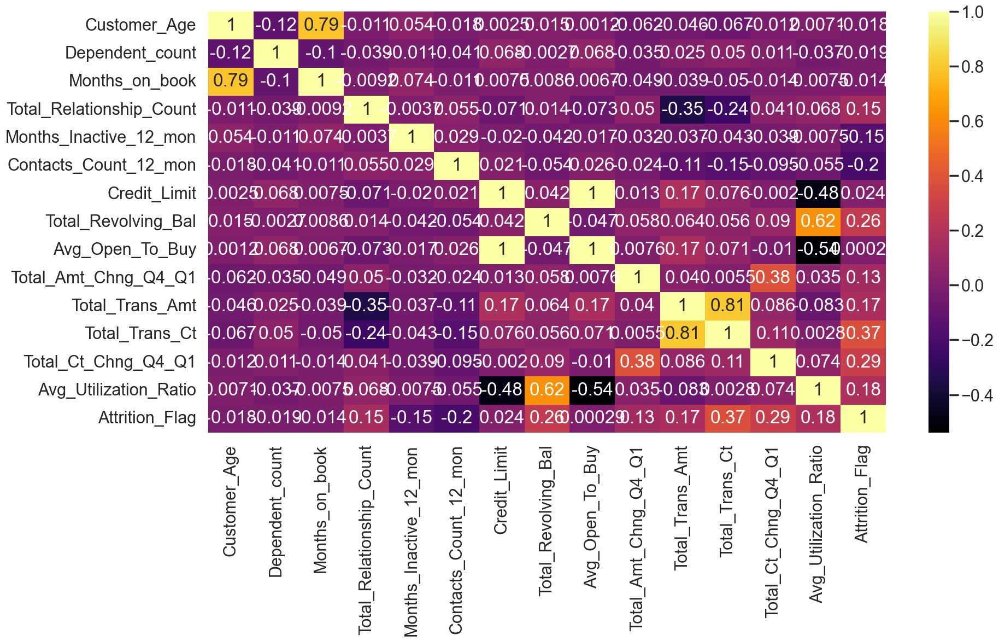

In [262]:
checkCorrFF(df)

From the heatmap above, we can drop these features:

|Feature Names|Reasons|
|-|-|
|Customer_Age|Looking at the heatmap, it correlates with 'Months_on_Book' (79%). We assumed that 'Months_on_Book' is more useful than 'Customer_Age'.|
|Credit_Limit|Looking at the heatmap, 'Credit_Limit' and 'Avg_Open_To_Buy' perfectly correlate to each other.|
|Total_Trans_Amt|Looking at the heatmap, it correlates with 'Total_Trans_Ct' (81%) and correlates with other features quite a lot.|
|Total_Amt_Chng_Q4_Q1|Looking at the heatmap, it correlates with 'Total_Ct_Chng_Q4_Q1' (38%).|
|Avg_Utilization_Ratio|Looking at the heatmap, it correlates too much with 3 features, 'Credit_Limit', 'Total_Revolving_Bal' and 'Avg_Open_To_Buy'.|

## **Data Preprocessing**
### **Label and One hot Encoding**

In [263]:
df_LE = df.copy()

df_LE['Gender'] = df_LE['Gender'].apply(lambda x: ['M', 'F'].index(x))
df_LE['Education_Level'] = df_LE['Education_Level'].apply(lambda x: ['Unknown', 'Uneducated', 'High School', 'College', 'Graduate', 'Post-Graduate', 'Doctorate'].index(x))
df_LE['Income_Category'] = df_LE['Income_Category'].apply(lambda x: ['Unknown', 'Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +'].index(x))

df_LE['Card_Category'] = df_LE['Card_Category'].map({'Silver' : 'NotBlue','Gold': 'NotBlue','Platinum': 'NotBlue'})
# df_LE['Card_Category'] = df_LE['Card_Category'].apply(lambda x: ['Blue', 'Silver', 'Gold', 'Platinum'].index(x))

x_LE = df_LE.drop(['Attrition_Flag'], axis = 1)
y_LE = df_LE['Attrition_Flag']
x_LE = pd.get_dummies(x_LE)

df_LE = pd.concat([x_LE, y_LE], axis=1)

df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,...,0.061,0,2,3,0,1,0,0,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,...,0.105,1,4,1,0,0,1,0,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,...,0.000,0,4,4,0,1,0,0,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,...,0.760,1,2,1,0,0,0,1,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,...,0.000,0,1,3,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,...,0.462,0,4,2,0,0,1,0,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,...,0.511,0,0,2,1,0,0,0,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,...,0.000,1,2,1,0,1,0,0,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,...,0.000,0,4,2,0,0,0,1,0,0


### **Drop data for Final Test**

<AxesSubplot:ylabel='Type'>

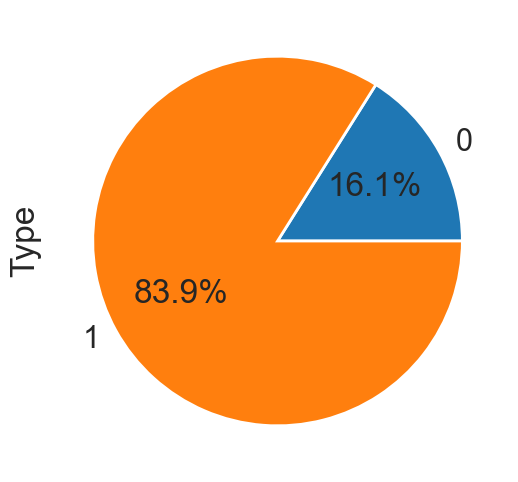

In [264]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.rcParams["figure.figsize"] = [8,6]

df.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [265]:
X = df_LE.drop(['Attrition_Flag'], axis=1)
y = df_LE['Attrition_Flag']
df_LE['Attrition_Flag'].value_counts()

1    8500
0    1627
Name: Attrition_Flag, dtype: int64

In [266]:
df_LE_x,df_LE_check_x,df_LE_y,df_LE_check_y = train_test_split(X, y, test_size = 0.05, random_state = 0)

df_LE = pd.concat([df_LE_x, df_LE_y], axis=1)
df_LE_check = pd.concat([df_LE_check_x, df_LE_check_y], axis=1)
df_LE_check.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.00000,507.000000,507.000000,...,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000
mean,46.289941,2.282051,36.031558,3.903353,2.396450,2.546351,8656.890138,1150.81854,7506.071598,0.765444,...,0.286055,0.532544,2.639053,2.096647,0.059172,0.459566,0.410256,0.071006,0.080868,0.848126
std,8.031605,1.319260,7.934452,1.506419,1.016964,1.110194,9399.394366,802.50074,9427.895168,0.218763,...,0.279280,0.499433,1.654403,1.486610,0.236179,0.498855,0.492366,0.257088,0.272901,0.359253
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.00000,3.000000,0.120000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2489.000000,503.50000,1159.500000,0.639500,...,0.019500,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,47.000000,2.000000,36.000000,4.000000,2.000000,3.000000,4188.000000,1276.00000,3241.000000,0.736000,...,0.188000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,52.000000,3.000000,41.000000,5.000000,3.000000,3.000000,10812.000000,1743.50000,9738.000000,0.866000,...,0.528000,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,66.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.00000,34516.000000,2.121000,...,0.999000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot:ylabel='Type'>

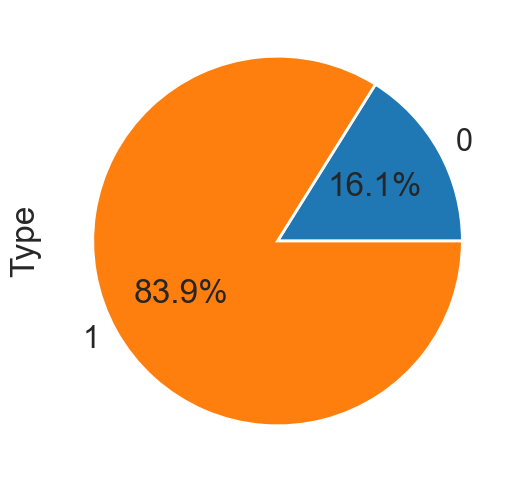

In [267]:
df_LE.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

<AxesSubplot:ylabel='Type'>

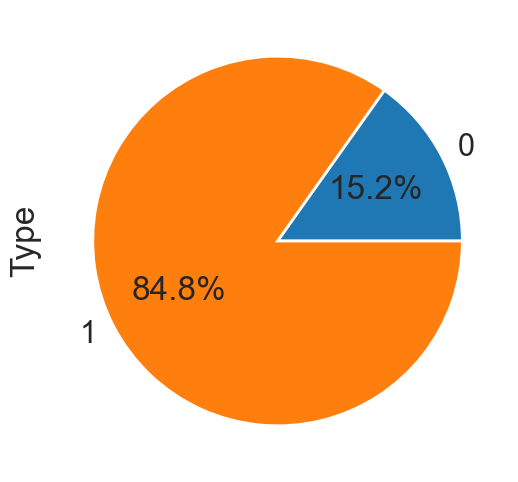

In [268]:
df_LE_check.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

### **Data Transformation**

In [269]:
df_sample = df_LE.copy()

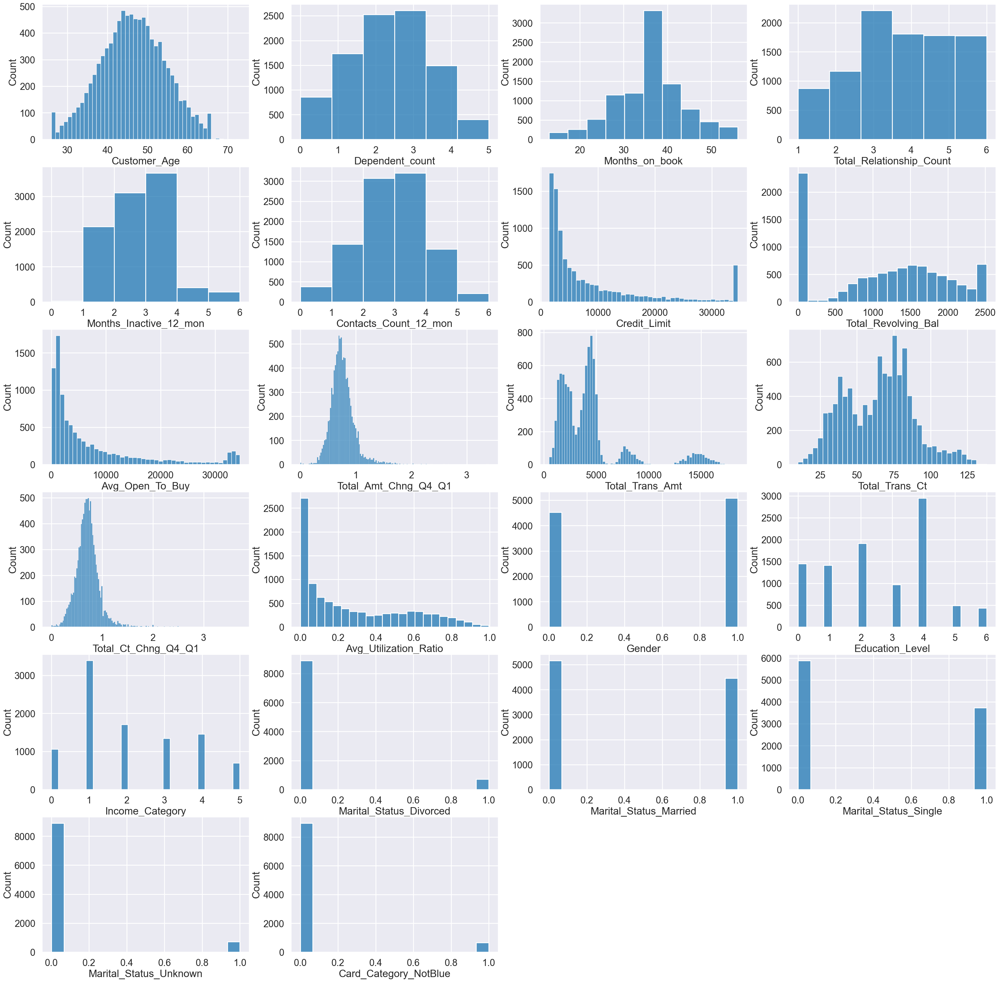

In [270]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_sample.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_sample[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_sample[col],bins=10)
        else:
            sns.histplot(df_sample[col])

In [271]:
df_sample.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [272]:
# log_var = ['Credit_Limit','Avg_Open_To_Buy',
#            'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

log_var = ['Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

for idx,col in enumerate(log_var):
    df_sample[col] = np.log10(df_sample[col]+1)
    df_LE_check[col] = np.log10(df_LE_check[col]+1)

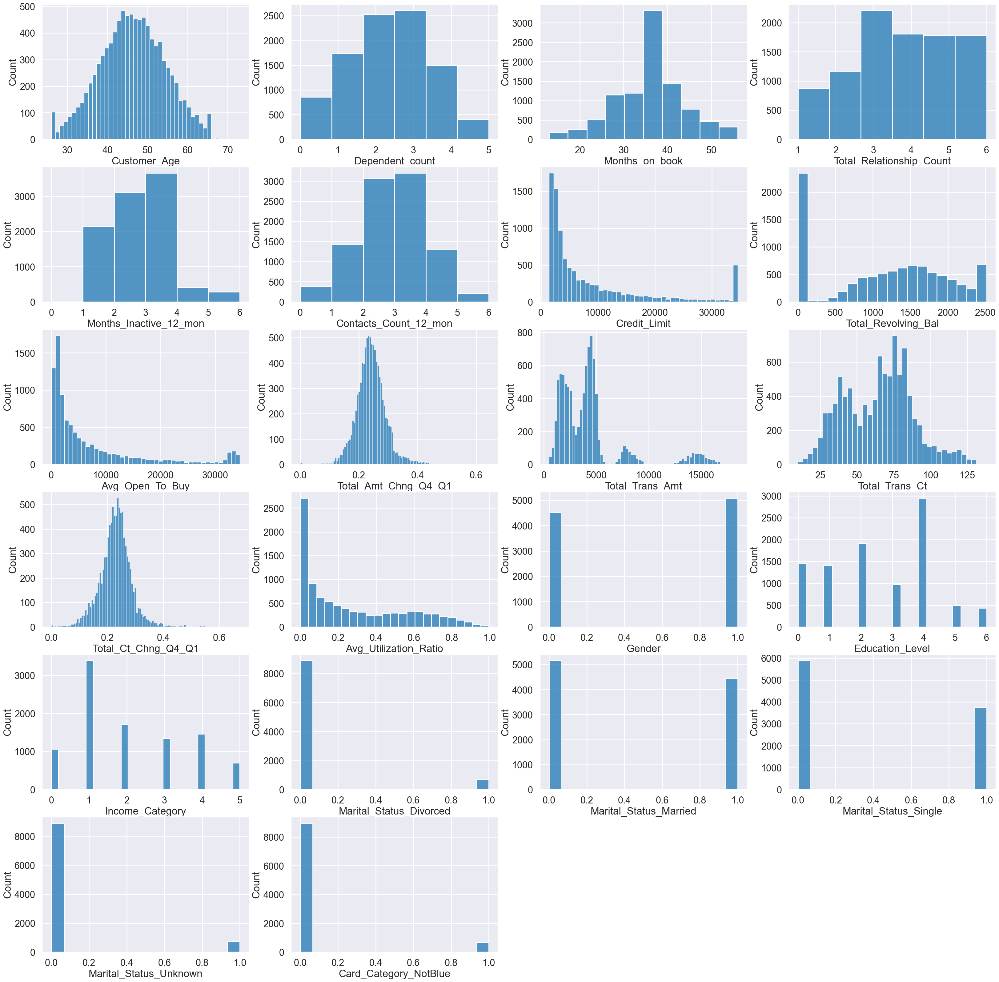

In [273]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_sample.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_sample[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_sample[col],bins=10)
        else:
            sns.histplot(df_sample[col])

### **Clear outlier**

In [274]:
# df_sample.boxplot(column=[str(i) for count, i in enumerate(df_sample.columns) if i != 'Attrition_Flag' and count < 10], figsize=(50,10), grid=False)

#### **Strip Plot**

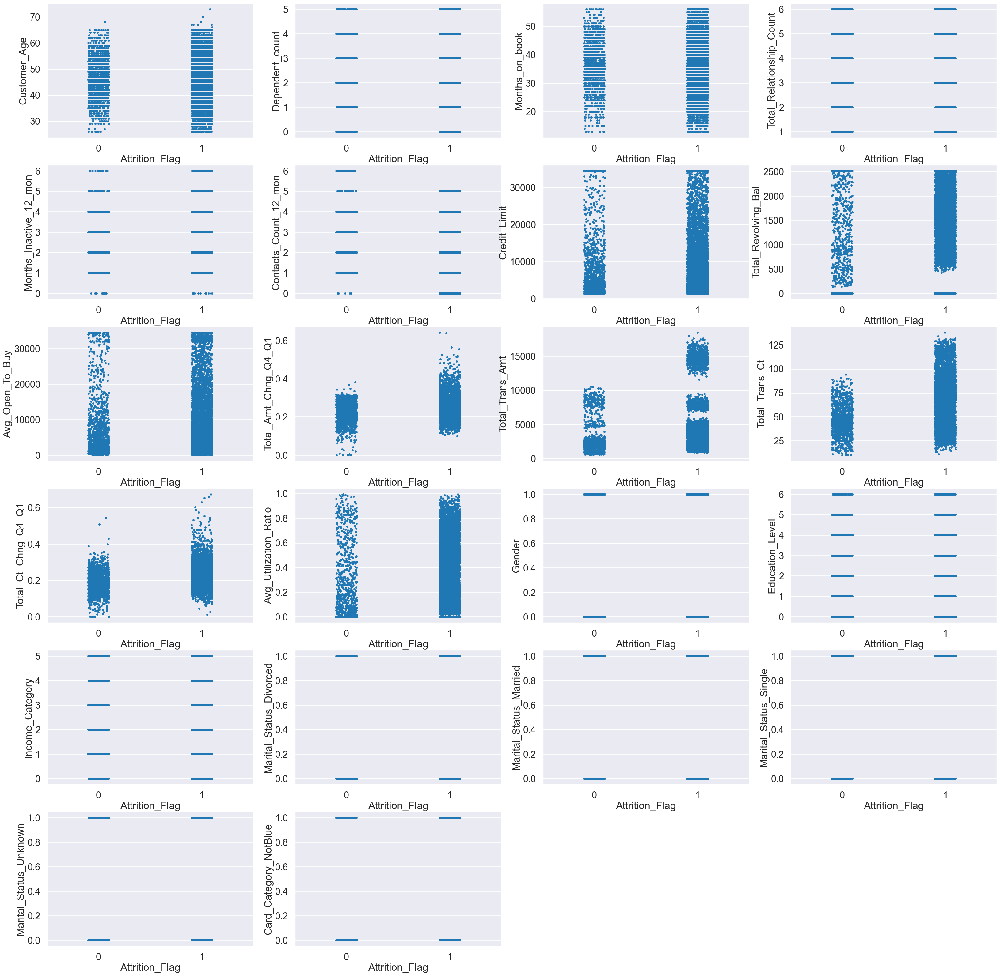

In [275]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_sample.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_sample)

#### **Remove Outliers**

In [276]:
df_sample.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [277]:
dfcpy = df_sample.copy()

In [278]:
# print('Before remove outlier, the shape of df_sample: {}'.format(df_sample.shape))

# df_sample = df_sample.drop(df_sample[df_sample['Avg_Open_To_Buy'] <= 2.2].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
# df_sample = df_sample.drop(df_sample[df_sample['Avg_Open_To_Buy'] <= 2.2].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
# print('df_sample.shape after remove outlier Avg_Open_To_Buy : {}'.format(df_sample.shape))

# df_sample = IQRdrop(df_sample, 'Total_Amt_Chng_Q4_Q1')
# df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] >= 0.32].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
# df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] <= 0.1].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
# print('df_sample.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_sample.shape))

# df_sample = df_sample.drop(df_sample[df_sample['Total_Trans_Amt'] >= 16000].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
# print('df_sample.shape after remove outlier Total_Trans_Amt : {}'.format(df_sample.shape))

# df_sample = IQRdrop(df_sample, 'Total_Ct_Chng_Q4_Q1')
# df_sample = df_sample.drop(df_sample[df_sample['Total_Ct_Chng_Q4_Q1'] >= 0.32].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
# print('df_sample.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_sample.shape))

# df_sample = IQRdrop(df_sample, 'Customer_Age')
# print('df_sample.shape after remove outlier Customer_Age : {}'.format(df_sample.shape))


In [279]:
df_sample = dfcpy.copy()

In [280]:
print('Before remove outlier, the shape of df_sample: {}'.format(df_sample.shape))

# df_sample = IQRdrop(df_sample, 'Total_Amt_Chng_Q4_Q1')
df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] >= 0.34].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] <= 0.1].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] >= 0.5].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Amt_Chng_Q4_Q1'] <= 0.0].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
print('df_sample.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_sample.shape))

# df_sample = IQRdrop(df_sample, 'Total_Ct_Chng_Q4_Q1')
df_sample = df_sample.drop(df_sample[df_sample['Total_Ct_Chng_Q4_Q1'] >= 0.4].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Ct_Chng_Q4_Q1'] <= 0.05].index & df_sample[df_sample['Attrition_Flag'] == 0].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Ct_Chng_Q4_Q1'] >= 0.45].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
df_sample = df_sample.drop(df_sample[df_sample['Total_Ct_Chng_Q4_Q1'] <= 0.07].index & df_sample[df_sample['Attrition_Flag'] == 1].index)
print('df_sample.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_sample.shape))

df_sample = IQRdrop(df_sample, 'Customer_Age')
print('df_sample.shape after remove outlier Customer_Age : {}'.format(df_sample.shape))


Before remove outlier, the shape of df_sample: (9620, 23)
df_sample.shape after remove outlier Total_Amt_Chng_Q4_Q1 : (9567, 23)
df_sample.shape after remove outlier Total_Ct_Chng_Q4_Q1 : (9513, 23)
df_sample.shape after remove outlier Customer_Age : (9511, 23)


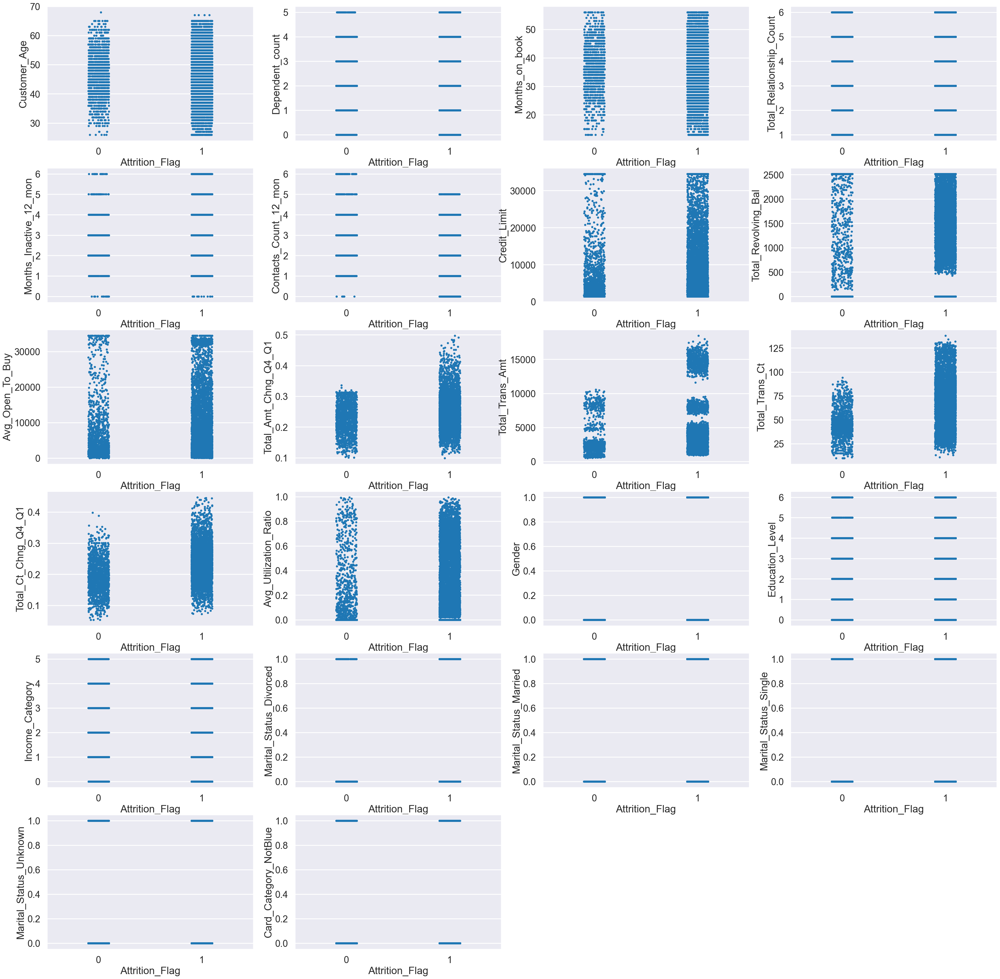

In [282]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_sample.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_sample)

### **Feature Scaling (Numerical)**

In [283]:
min_max_scaler_up = MinMaxScaler()
for idx in df_sample.columns:
    if idx not in ['Attrition_Flag']:
        df_sample[idx]=min_max_scaler_up.fit_transform(df_sample[idx].values.reshape(-1,1))
        df_LE_check[idx]=min_max_scaler_up.transform(df_LE_check[idx].values.reshape(-1,1))

In [284]:
df_sample.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000,...,9511.000000,9511.000000,9511.000000,9511.000000,9511.00000,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000
mean,0.483696,0.469856,0.532871,0.562065,0.389689,0.408387,0.216655,0.462847,0.215318,0.359609,...,0.276381,0.529808,0.433218,0.416739,0.07465,0.461781,0.389234,0.074335,0.067185,0.842498
std,0.190608,0.259561,0.185777,0.311530,0.168415,0.184058,0.273726,0.323514,0.262385,0.121038,...,0.276840,0.499137,0.283395,0.294680,0.26284,0.498563,0.487602,0.262329,0.250356,0.364292
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.357143,0.200000,0.418605,0.400000,0.333333,0.333333,0.033866,0.161104,0.038385,0.284635,...,0.025126,0.000000,0.166667,0.200000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.476190,0.400000,0.534884,0.600000,0.333333,0.333333,0.094193,0.507747,0.100417,0.353234,...,0.176884,1.000000,0.500000,0.400000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.619048,0.600000,0.627907,0.800000,0.500000,0.500000,0.288690,0.709178,0.284110,0.426014,...,0.505528,1.000000,0.666667,0.600000,0.00000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


In [285]:
df_LE_check.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,...,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000
mean,0.483094,0.456410,0.535618,0.580671,0.399408,0.424392,0.218231,0.457218,0.217240,0.363128,...,0.287493,0.532544,0.439842,0.419329,0.059172,0.459566,0.410256,0.071006,0.080868,0.848126
std,0.191229,0.263852,0.184522,0.301284,0.169494,0.185032,0.284161,0.318832,0.273225,0.128894,...,0.280684,0.499433,0.275734,0.297322,0.236179,0.498855,0.492366,0.257088,0.272901,0.359253
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000203,-0.124856,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.357143,0.200000,0.441860,0.400000,0.333333,0.333333,0.031765,0.200040,0.033313,0.290298,...,0.019598,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.500000,0.400000,0.534884,0.600000,0.333333,0.500000,0.083129,0.506953,0.093636,0.352607,...,0.188945,1.000000,0.500000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.619048,0.600000,0.651163,0.800000,0.500000,0.500000,0.283384,0.692690,0.281922,0.431281,...,0.530653,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,0.952381,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.991654,...,1.004020,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### **Feature Selection**

In [286]:
selector = SelectKBest(f_classif, k=10)
x_sa = df_sample.drop(['Attrition_Flag'], axis = 1)
y_sa = df_sample['Attrition_Flag']

df_sa_anova = selector.fit(x_sa, y_sa)

col = selector.get_support(indices=True)
df_sa_anova = x_sa.iloc[:,col]

#### **Concatenate Data**

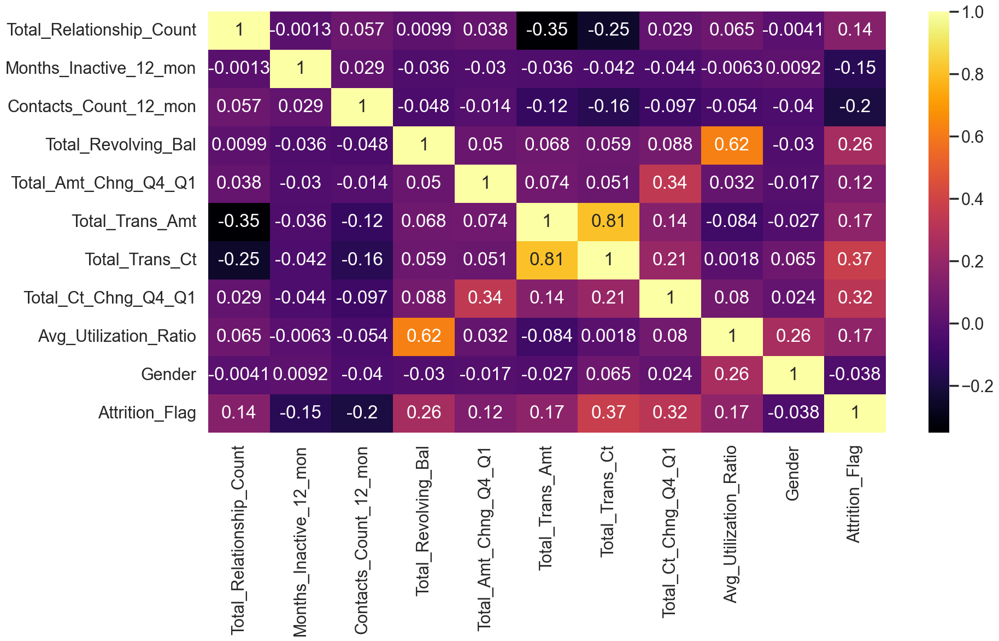

In [287]:
df_sa_anova = pd.concat([df_sa_anova, y_sa], axis=1)
checkCorrFF(df_sa_anova)

#### **Drop Feature**

In [288]:
df_sa_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Gender', 'Attrition_Flag'],
      dtype='object')

In [289]:
# df_sa_anova.drop(['Credit_Limit'], axis=1, inplace=True)
df_sa_anova.drop(['Avg_Utilization_Ratio','Gender'], axis=1, inplace=True)
# df_sa_anova.drop(['Credit_Limit','Avg_Utilization_Ratio'], axis=1, inplace=True) # best
# df_sa_anova.drop(['Credit_Limit','Avg_Utilization_Ratio','Total_Trans_Amt'], axis=1, inplace=True) 
# df_sa_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Credit_Limit'], axis=1, inplace=True) 
# df_sa_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Credit_Limit'], axis=1, inplace=True) 

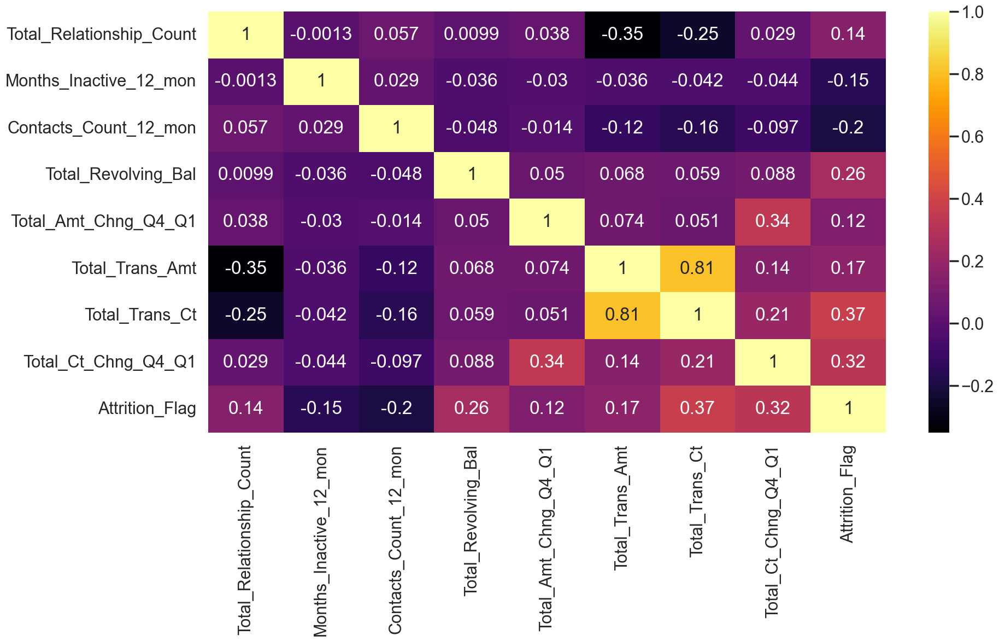

In [290]:
checkCorrFF(df_sa_anova)

In [291]:
x_sa_anova = df_sa_anova.drop(['Attrition_Flag'], axis = 1)
y_sa_anova = df_sa_anova['Attrition_Flag']

In [292]:
x_sa_anova

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
7511,1.0,0.166667,0.333333,0.524037,0.421899,0.227440,0.445312,0.404711
247,0.4,0.500000,0.500000,0.000000,0.495886,0.010626,0.070312,0.465893
713,0.6,0.333333,0.000000,0.651172,0.426600,0.058140,0.226562,0.398606
4527,1.0,0.500000,0.333333,0.000000,0.247263,0.069489,0.187500,0.076321
6866,1.0,0.333333,0.333333,0.000000,0.236146,0.218594,0.554688,0.641835
...,...,...,...,...,...,...,...,...
9225,0.0,0.500000,0.500000,0.535956,0.485381,0.701791,0.726562,0.477986
4859,0.6,0.500000,0.500000,0.255066,0.401090,0.185045,0.554688,0.463330
3264,0.6,0.500000,0.000000,0.711164,0.496436,0.199455,0.445312,0.579526
9845,0.4,0.500000,0.333333,0.586412,0.369421,0.758596,0.851562,0.496816


In [293]:
y_sa_anova

7511    1
247     0
713     1
4527    0
6866    1
       ..
9225    1
4859    1
3264    1
9845    1
2732    1
Name: Attrition_Flag, Length: 9511, dtype: int64

# **Resampling Method 0** : No Resampling 
<hr>

1    6433
0    1175
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

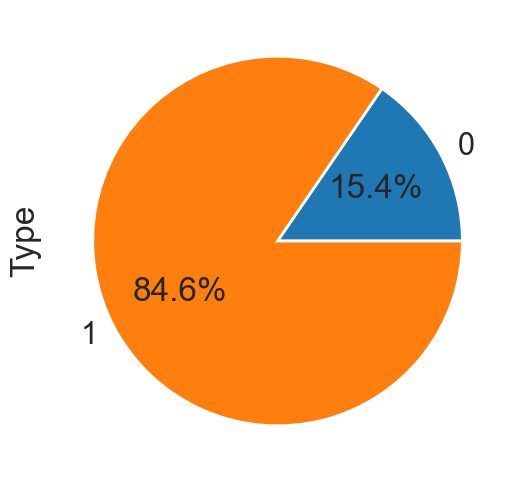

In [294]:
x_sa_anova_train,x_sa_anova_test,y_sa_anova_train,y_sa_anova_test = train_test_split(x_sa_anova, y_sa_anova, test_size = 0.2, random_state = 0)

df_sa_anova_train =  pd.concat([x_sa_anova_train, y_sa_anova_train], axis=1)

print(df_sa_anova_train["Attrition_Flag"].value_counts())

df_sa_anova_train.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.9411 se=0.002
>f1 score 2 mean=0.9412 se=0.001
>f1 score 3 mean=0.9413 se=0.001
>f1 score 4 mean=0.9414 se=0.001
>f1 score 5 mean=0.9414 se=0.001


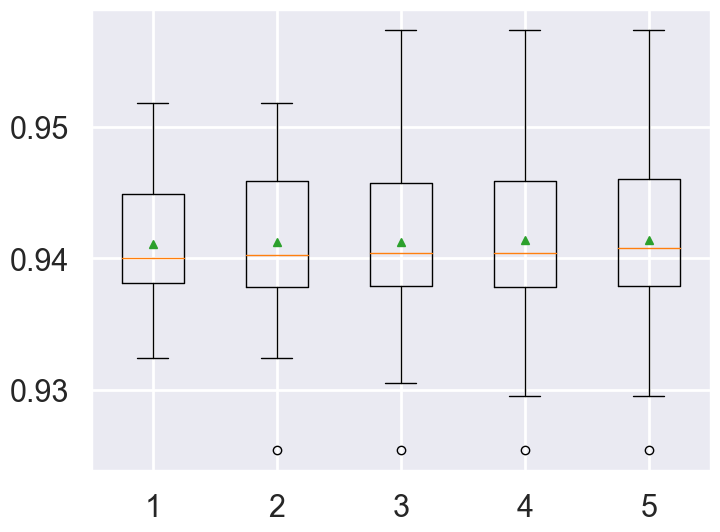

In [295]:
_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_sa_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_sa_anova = evaluate_model(x_sa_anova_train, y_sa_anova_train, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_sa_anova), sem(scores_sa_anova)))
	# store
	results_sa_anova.append(scores_sa_anova)
# plot the results
plt.boxplot(results_sa_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [296]:
grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_sa_anova=LogisticRegression()
logreg_cv_sa_anova=GridSearchCV(logreg_sa_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_sa_anova.fit(x_sa_anova_train,y_sa_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_sa_anova.best_params_)
print("f1 :",logreg_cv_sa_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
f1 : 0.9419903670106095


In [297]:
clf_sa_anova = LogisticRegression(C=logreg_cv_sa_anova.best_params_['C']#
                                  , penalty=logreg_cv_sa_anova.best_params_['penalty']
                                  , solver=logreg_cv_sa_anova.best_params_['solver'])

clf_sa_anova.fit(x_sa_anova_train,y_sa_anova_train)
print("model score: %.8f" % clf_sa_anova.score(x_sa_anova_test, y_sa_anova_test))

model score: 0.89595376


### **Model Threshold**

(0.0, 1.0)

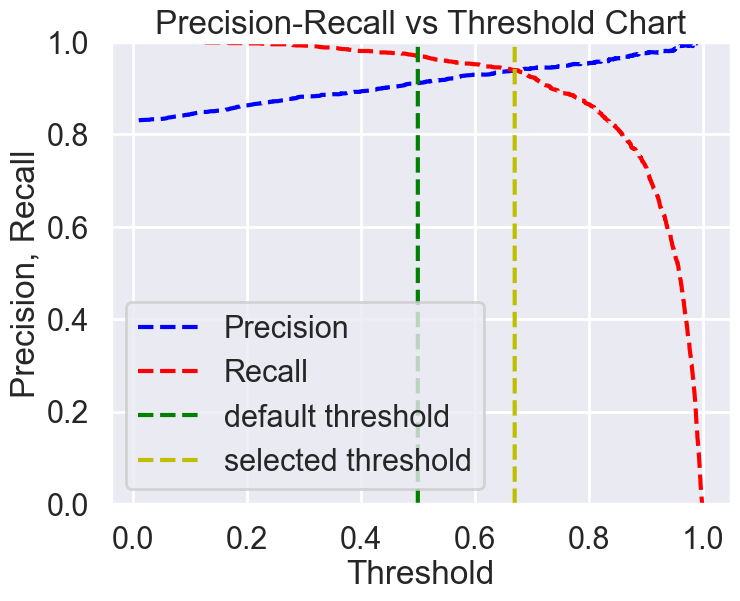

In [365]:
pred_y_sa=clf_sa_anova.predict(x_sa_anova_test) 

probs_y_sa=clf_sa_anova.predict_proba(x_sa_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_sa_anova_test, probs_y_sa[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.plot(np.full(3252, 0.67),np.arange(0,1,1/3252), "y--", label="selected threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [299]:
# Classification report
y_sa_anova_pred = clf_sa_anova.predict(x_sa_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_train, y_pred=y_sa_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_train, y_pred=y_sa_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.76      0.49      0.60      1175
           1       0.91      0.97      0.94      6433

    accuracy                           0.90      7608
   macro avg       0.84      0.73      0.77      7608
weighted avg       0.89      0.90      0.89      7608

Confusion matrix 
[[ 579  596]
 [ 180 6253]]


In [300]:
# Classification report
y_sa_anova_pred = clf_sa_anova.predict(x_sa_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_sa_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_sa_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.78      0.54      0.64       323
           1       0.91      0.97      0.94      1580

    accuracy                           0.90      1903
   macro avg       0.85      0.75      0.79      1903
weighted avg       0.89      0.90      0.89      1903

Confusion matrix 
[[ 173  150]
 [  48 1532]]


In [366]:
y_pred_new_threshold = (clf_sa_anova.predict_proba(x_sa_anova_test)[:,1]>=0.67).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))

Classification report 
              precision    recall  f1-score   support

           0       0.70      0.70      0.70       323
           1       0.94      0.94      0.94      1580

    accuracy                           0.90      1903
   macro avg       0.82      0.82      0.82      1903
weighted avg       0.90      0.90      0.90      1903

Confusion matrix 
[[ 227   96]
 [  97 1483]]


# **Resampling Method 1** : SMOTE (Synthetic Minority Oversampling TEchnique)
<hr>

### **Resampling**

In [301]:
su = SMOTE(random_state=42)
x_su, y_su = su.fit_resample(x_sa_anova_train, y_sa_anova_train)
df_up_anova = pd.concat([x_su, y_su], axis=1)

0    6433
1    6433
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

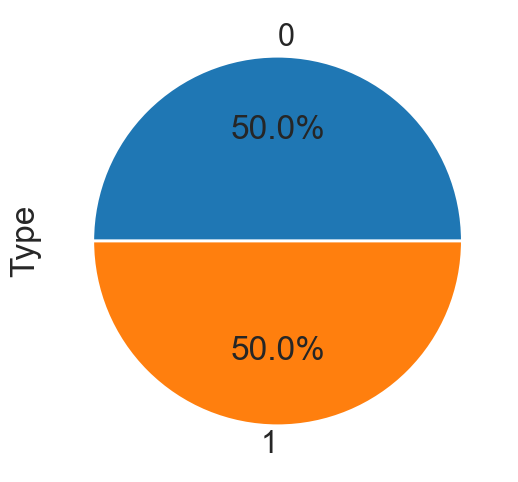

In [302]:
print(df_up_anova["Attrition_Flag"].value_counts())

df_up_anova.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [303]:
df_up_anova.describe()

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Attrition_Flag
count,12866.000000,12866.000000,12866.000000,12866.000000,12866.000000,12866.000000,12866.000000,12866.000000,12866.000000
mean,0.522030,0.413170,0.442420,0.385505,0.346161,0.190896,0.371284,0.405470,0.500000
std,0.317091,0.157170,0.184788,0.355545,0.118775,0.171074,0.171888,0.139569,0.500019
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.200000,0.333333,0.333333,0.000000,0.270516,0.087541,0.241467,0.310136,0.000000
50%,0.540206,0.496830,0.500000,0.377433,0.346313,0.120469,0.328125,0.410109,0.500000
75%,0.800000,0.500000,0.500000,0.679274,0.422427,0.227036,0.500000,0.498060,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.968750,0.993269,1.000000


### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8459 se=0.005
>f1 score 2 mean=0.8463 se=0.003
>f1 score 3 mean=0.8465 se=0.002
>f1 score 4 mean=0.8466 se=0.002
>f1 score 5 mean=0.8466 se=0.001


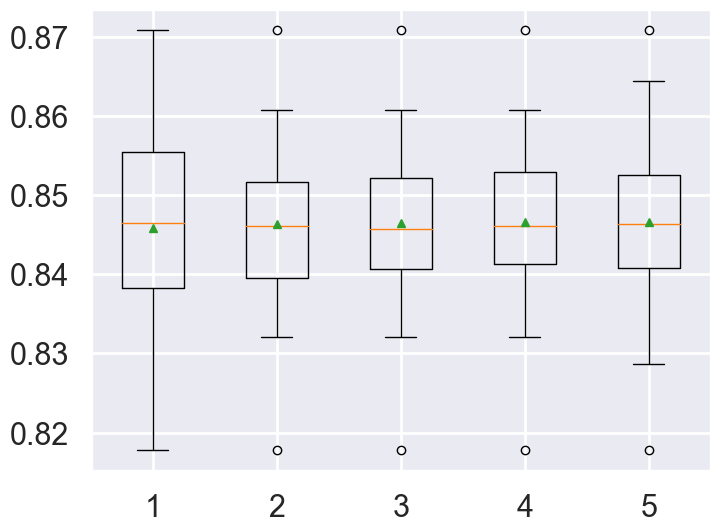

In [304]:
x_up_anova_train = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova_train = df_up_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_up_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_up_anova = evaluate_model(x_up_anova_train, y_up_anova_train, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_up_anova), sem(scores_up_anova)))
	# store
	results_up_anova.append(scores_up_anova)
# plot the results
plt.boxplot(results_up_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [305]:
grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_up_anova=LogisticRegression()
logreg_cv_up_anova=GridSearchCV(logreg_up_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_up_anova.fit(x_up_anova_train,y_up_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_up_anova.best_params_)
print("f1 :",logreg_cv_up_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
f1 : 0.8470775059798348


In [306]:
clf_up_anova = LogisticRegression(C=logreg_cv_up_anova.best_params_['C']#
                                  , penalty=logreg_cv_up_anova.best_params_['penalty']
                                  , solver=logreg_cv_up_anova.best_params_['solver'])

clf_up_anova.fit(x_up_anova_train,y_up_anova_train)
print("model score: %.8f" % clf_up_anova.score(x_sa_anova_test, y_sa_anova_test))

model score: 0.82816605


### **Model Threshold**

(0.0, 1.0)

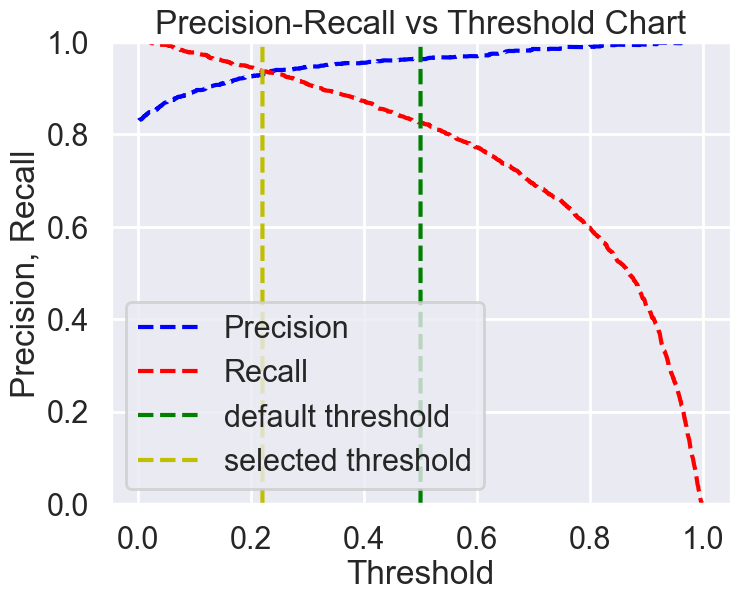

In [362]:
pred_y_up=clf_up_anova.predict(x_sa_anova_test) 

probs_y_up=clf_up_anova.predict_proba(x_sa_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_sa_anova_test, probs_y_up[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.plot(np.full(3252, 0.22),np.arange(0,1,1/3252), "y--", label="selected threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [308]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_train, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_train, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      6433
           1       0.85      0.84      0.85      6433

    accuracy                           0.85     12866
   macro avg       0.85      0.85      0.85     12866
weighted avg       0.85      0.85      0.85     12866

Confusion matrix 
[[5514  919]
 [1032 5401]]


In [309]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_sa_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.50      0.85      0.63       323
           1       0.96      0.82      0.89      1580

    accuracy                           0.83      1903
   macro avg       0.73      0.83      0.76      1903
weighted avg       0.88      0.83      0.84      1903

Confusion matrix 
[[ 273   50]
 [ 277 1303]]


In [363]:
y_pred_new_threshold = (clf_up_anova.predict_proba(x_sa_anova_test)[:,1]>=0.22).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))

Classification report 
              precision    recall  f1-score   support

           0       0.68      0.65      0.66       323
           1       0.93      0.94      0.93      1580

    accuracy                           0.89      1903
   macro avg       0.80      0.79      0.80      1903
weighted avg       0.89      0.89      0.89      1903

Confusion matrix 
[[ 209  114]
 [ 100 1480]]


# **Resampling Method 2** : Downsampling
<hr>

### **Resampling**

In [310]:
maxcount = df_sa_anova_train['Attrition_Flag'].value_counts()[0]/2
df_dwsampled = df_sa_anova_train[0:0]
for grp in df_sa_anova_train['Attrition_Flag'].unique():
    GrpDF = df_sa_anova_train[df_sa_anova_train['Attrition_Flag'] == grp]
    resampled = resample(GrpDF, replace=True, n_samples=int(maxcount), random_state=123)
    df_dwsampled = df_dwsampled.append(resampled)

0    587
1    587
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

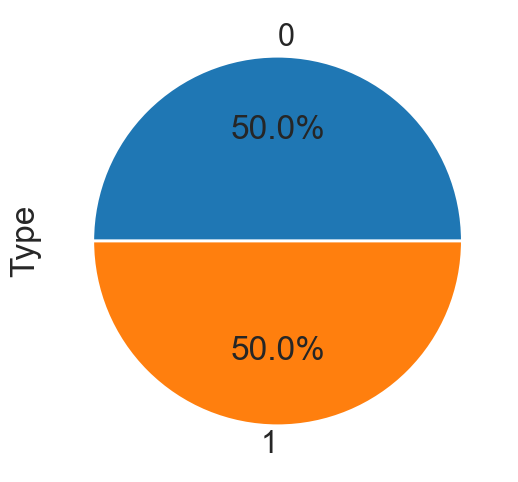

In [311]:
print(df_dwsampled["Attrition_Flag"].value_counts())

df_dwsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [312]:
df_dwsampled.describe()

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Attrition_Flag
count,1174.000000,1174.000000,1174.000000,1174.000000,1174.000000,1174.000000,1174.000000,1174.000000,1174.000000
mean,0.524361,0.417660,0.439381,0.382265,0.348477,0.187446,0.366309,0.412255,0.500000
std,0.321764,0.170353,0.184644,0.354301,0.125150,0.171763,0.173637,0.145129,0.500213
min,0.000000,0.000000,0.000000,0.000000,0.016357,0.001113,0.000000,0.000000,0.000000
25%,0.200000,0.333333,0.333333,0.000000,0.264579,0.082286,0.234375,0.311606,0.000000
50%,0.600000,0.500000,0.500000,0.369090,0.345682,0.118783,0.328125,0.414811,0.500000
75%,0.800000,0.500000,0.500000,0.681565,0.434779,0.226257,0.492188,0.504259,1.000000
max,1.000000,1.000000,1.000000,1.000000,0.985353,0.952709,0.914062,0.865863,1.000000


### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8203 se=0.012
>f1 score 2 mean=0.8184 se=0.012
>f1 score 3 mean=0.8175 se=0.008
>f1 score 4 mean=0.8167 se=0.008
>f1 score 5 mean=0.8173 se=0.007


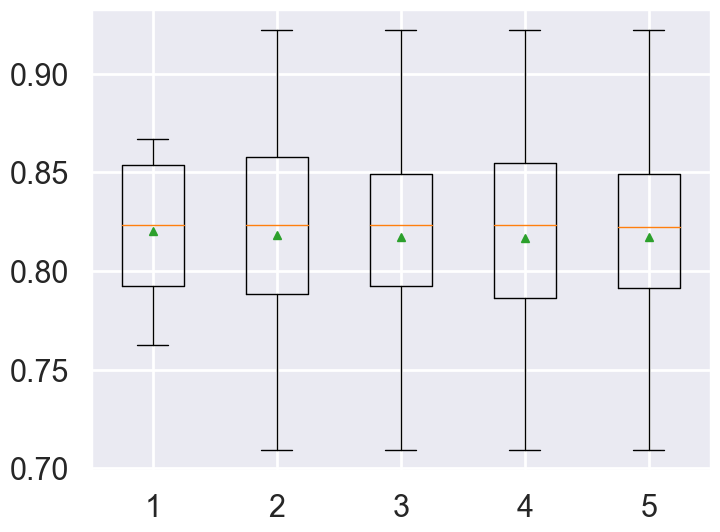

In [313]:
x_dw_anova_train = df_dwsampled.drop(['Attrition_Flag'], axis = 1)
y_dw_anova_train = df_dwsampled['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_dw_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_dw_anova = evaluate_model(x_dw_anova_train, y_dw_anova_train, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_dw_anova), sem(scores_dw_anova)))
	# store
	results_dw_anova.append(scores_dw_anova)
# plot the results
plt.boxplot(results_dw_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [314]:
grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_dw_anova=LogisticRegression()
logreg_cv_dw_anova=GridSearchCV(logreg_dw_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_dw_anova.best_params_)
print("f1 :",logreg_cv_dw_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'solver': 'saga'}
f1 : 0.8267894384248626


In [315]:
clf_dw_anova = LogisticRegression(C=logreg_cv_dw_anova.best_params_['C']#
                                  , penalty=logreg_cv_dw_anova.best_params_['penalty']
                                  , solver=logreg_cv_dw_anova.best_params_['solver'])

clf_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)
print("model score: %.8f" % clf_dw_anova.score(x_sa_anova_test, y_sa_anova_test))

model score: 0.81765633


### **Model Threshold**

(0.0, 1.0)

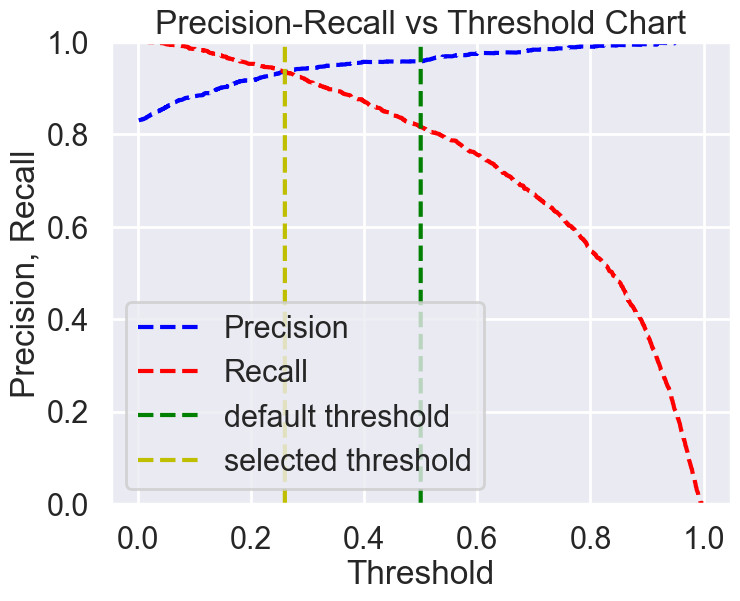

In [369]:
pred_y_dw=clf_dw_anova.predict(x_sa_anova_test) 

probs_y_dw=clf_dw_anova.predict_proba(x_sa_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_sa_anova_test, probs_y_dw[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.plot(np.full(3252, 0.26),np.arange(0,1,1/3252), "y--", label="selected threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [317]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       587
           1       0.83      0.82      0.83       587

    accuracy                           0.83      1174
   macro avg       0.83      0.83      0.83      1174
weighted avg       0.83      0.83      0.83      1174

Confusion matrix 
[[489  98]
 [105 482]]


In [318]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_sa_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.48      0.83      0.61       323
           1       0.96      0.82      0.88      1580

    accuracy                           0.82      1903
   macro avg       0.72      0.82      0.74      1903
weighted avg       0.88      0.82      0.83      1903

Confusion matrix 
[[ 267   56]
 [ 291 1289]]


In [370]:
y_pred_new_threshold = (clf_dw_anova.predict_proba(x_sa_anova_test)[:,1]>=0.26).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))

Classification report 
              precision    recall  f1-score   support

           0       0.68      0.69      0.68       323
           1       0.94      0.93      0.94      1580

    accuracy                           0.89      1903
   macro avg       0.81      0.81      0.81      1903
weighted avg       0.89      0.89      0.89      1903

Confusion matrix 
[[ 222  101]
 [ 104 1476]]


# **Resampling Method 3** : Tomek Links
<hr>

### **Resampling**

In [319]:
df_sa_anova_train =  pd.concat([x_sa_anova_train, y_sa_anova_train], axis=1)

undersample = TomekLinks()

# transform the dataset
dfX = df_sa_anova_train.drop(['Attrition_Flag'], axis=1)
dfY = df_sa_anova_train['Attrition_Flag']
X, y = undersample.fit_resample(dfX, dfY)
dfTomek = pd.concat([X, y], axis=1)

1    6300
0    1175
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

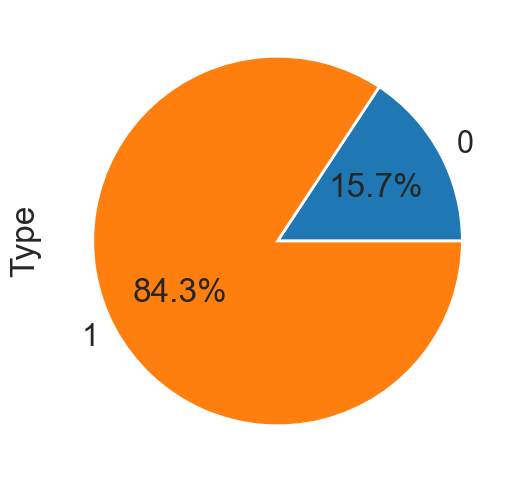

In [320]:
print(dfTomek["Attrition_Flag"].value_counts())

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [321]:
dfTomek.describe()

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Attrition_Flag
count,7475.000000,7475.000000,7475.000000,7475.000000,7475.000000,7475.000000,7475.000000,7475.000000,7475.000000
mean,0.562488,0.389320,0.405619,0.464716,0.360618,0.222627,0.436676,0.447538,0.842809
std,0.312157,0.168722,0.184106,0.322799,0.120776,0.191345,0.181680,0.131214,0.364005
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.400000,0.333333,0.333333,0.188121,0.286637,0.097224,0.289062,0.373149,1.000000
50%,0.600000,0.333333,0.333333,0.508939,0.353861,0.193168,0.453125,0.451723,1.000000
75%,0.800000,0.500000,0.500000,0.709376,0.427186,0.237371,0.554688,0.524473,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.968750,0.993269,1.000000


### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.9432 se=0.003
>f1 score 2 mean=0.9432 se=0.002
>f1 score 3 mean=0.9432 se=0.001
>f1 score 4 mean=0.9433 se=0.001
>f1 score 5 mean=0.9432 se=0.001


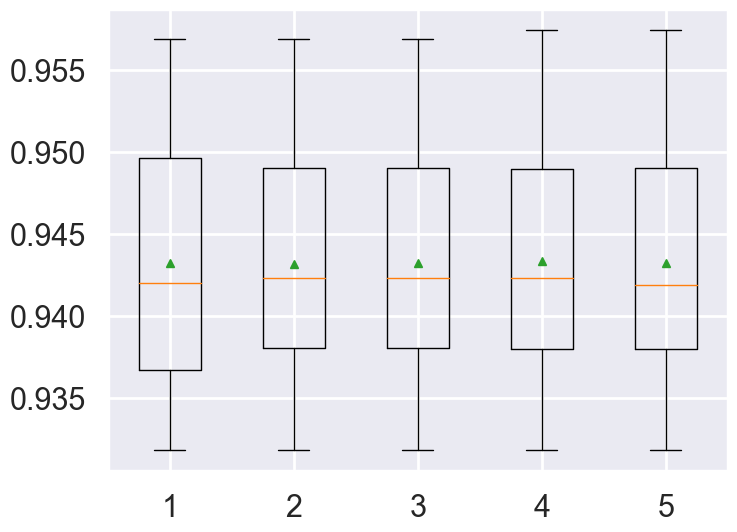

In [322]:
x_tm_anova_train = dfTomek.drop(['Attrition_Flag'], axis = 1)
y_tm_anova_train = dfTomek['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_tm_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_tm_anova = evaluate_model(x_tm_anova_train, y_tm_anova_train, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_tm_anova), sem(scores_tm_anova)))
	# store
	results_tm_anova.append(scores_tm_anova)
# plot the results
plt.boxplot(results_tm_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [323]:
grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_tm_anova=LogisticRegression()
logreg_cv_tm_anova=GridSearchCV(logreg_tm_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_tm_anova.best_params_)
print("f1 :",logreg_cv_tm_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}
f1 : 0.9435574286876124


In [324]:
clf_tm_anova = LogisticRegression(C=logreg_cv_tm_anova.best_params_['C']#
                                  , penalty=logreg_cv_tm_anova.best_params_['penalty']
                                  , solver=logreg_cv_tm_anova.best_params_['solver'])

clf_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)
print("model score: %.8f" % clf_tm_anova.score(x_sa_anova_test, y_sa_anova_test))

model score: 0.89490279


### **Model Threshold**

(0.0, 1.0)

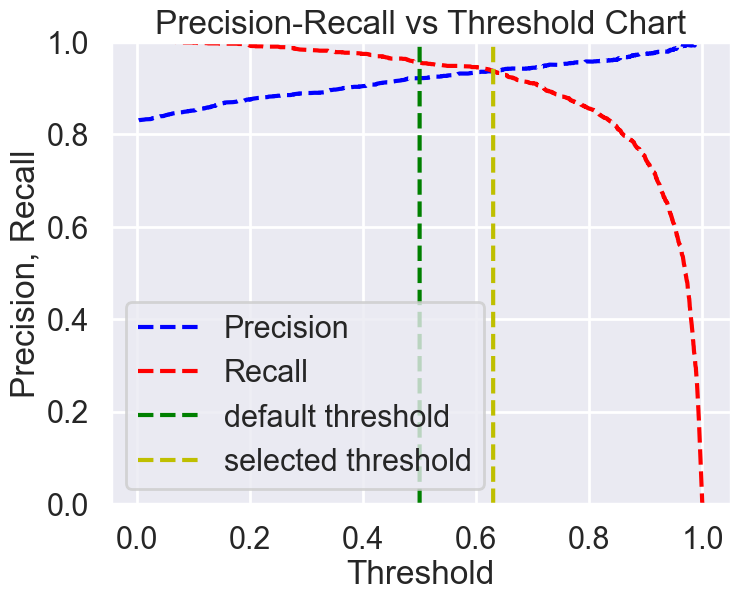

In [372]:
pred_y_tm=clf_tm_anova.predict(x_sa_anova_test) 

probs_y_tm=clf_tm_anova.predict_proba(x_sa_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_sa_anova_test, probs_y_tm[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.plot(np.full(3252, 0.63),np.arange(0,1,1/3252), "y--", label="selected threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [346]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.76      0.56      0.64      1175
           1       0.92      0.97      0.94      6300

    accuracy                           0.90      7475
   macro avg       0.84      0.76      0.79      7475
weighted avg       0.90      0.90      0.90      7475

Confusion matrix 
[[ 655  520]
 [ 205 6095]]


In [327]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_sa_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.73      0.60      0.66       323
           1       0.92      0.96      0.94      1580

    accuracy                           0.89      1903
   macro avg       0.83      0.78      0.80      1903
weighted avg       0.89      0.89      0.89      1903

Confusion matrix 
[[ 194  129]
 [  71 1509]]


In [373]:
y_pred_new_threshold = (clf_tm_anova.predict_proba(x_sa_anova_test)[:,1]>=0.63).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_sa_anova_test, y_pred=y_pred_new_threshold))

Classification report 
              precision    recall  f1-score   support

           0       0.69      0.69      0.69       323
           1       0.94      0.94      0.94      1580

    accuracy                           0.90      1903
   macro avg       0.81      0.82      0.81      1903
weighted avg       0.90      0.90      0.90      1903

Confusion matrix 
[[ 224   99]
 [ 100 1480]]


# **Classification report for check data set**

In [375]:
check = df_LE_check.copy()

for col in check.columns:
    if col not in clf_sa_anova.feature_names_in_ and col != 'Attrition_Flag':
        check.drop(col, axis=1, inplace=True)
checkx = check.drop(['Attrition_Flag'], axis = 1)
checky = check['Attrition_Flag']

In [387]:
y_pred_sa = (clf_sa_anova.predict_proba(checkx)[:,1]>=0.67).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred_sa))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred_sa))

Classification report 
              precision    recall  f1-score   support

           0       0.64      0.77      0.70        77
           1       0.96      0.92      0.94       430

    accuracy                           0.90       507
   macro avg       0.80      0.84      0.82       507
weighted avg       0.91      0.90      0.90       507

Confusion matrix 
[[ 59  18]
 [ 33 397]]


In [386]:
y_pred_tm = (clf_tm_anova.predict_proba(checkx)[:,1]>=0.63).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred_tm))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred_tm))

Classification report 
              precision    recall  f1-score   support

           0       0.64      0.77      0.70        77
           1       0.96      0.92      0.94       430

    accuracy                           0.90       507
   macro avg       0.80      0.84      0.82       507
weighted avg       0.91      0.90      0.90       507

Confusion matrix 
[[ 59  18]
 [ 33 397]]


In [385]:
y_pred_up = (clf_up_anova.predict_proba(checkx)[:,1]>=0.22).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred_up))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred_up))

Classification report 
              precision    recall  f1-score   support

           0       0.66      0.71      0.69        77
           1       0.95      0.93      0.94       430

    accuracy                           0.90       507
   macro avg       0.81      0.82      0.81       507
weighted avg       0.90      0.90      0.90       507

Confusion matrix 
[[ 55  22]
 [ 28 402]]


In [388]:
y_pred_dw = (clf_dw_anova.predict_proba(checkx)[:,1]>=0.26).astype(int)

print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred_dw))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred_dw))

Classification report 
              precision    recall  f1-score   support

           0       0.67      0.73      0.70        77
           1       0.95      0.93      0.94       430

    accuracy                           0.90       507
   macro avg       0.81      0.83      0.82       507
weighted avg       0.91      0.90      0.91       507

Confusion matrix 
[[ 56  21]
 [ 28 402]]


In [392]:
from sklearn.decomposition import PCA
df_LE_pca = df_LE.copy()
x_pca = df_LE_pca.drop(['Attrition_Flag'], axis = 1)
y_pca = df_LE_pca['Attrition_Flag']
pca = PCA(n_components = 4)           # Create PCA transformer
x_pca = pca.fit_transform(x_pca)          # Fit and transform PCA transformer to the dataset

print(pca.explained_variance_ratio_)  # This show the variance of each component.
df_LE_pca = pd.DataFrame(x_pca, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])

[9.30553382e-01 6.38336322e-02 5.61112635e-03 1.07460392e-06]


# **Conclusion**

#### Tomek Links
Comparing no resampling to T-Link, we can conclude that 'this dataset' <u>is not fit for using T-Link method</u> to resample data. This is because, according to <a href='https://www.analyticsvidhya.com/blog/2020/11/handling-imbalanced-data-machine-learning-computer-vision-and-nlp/'>this website</a>, T-link is basically a pair of data points from different classes (nearest-neighbors). The objective is to drop the sample that corresponds to the
majority and thereby minimalizing the count of the dominating label. However, as you can see from the graphs below, this dataset contains a lot of data with low variance between class.

<Figure size 2000x1200 with 0 Axes>

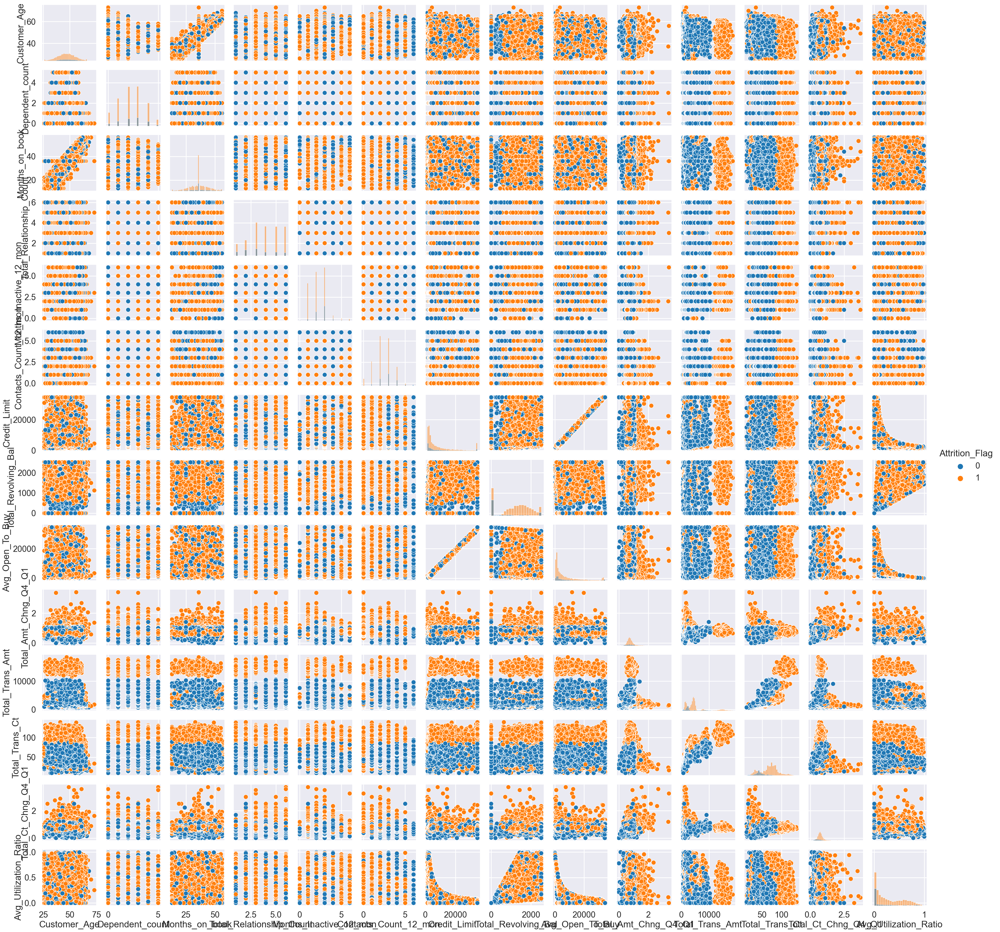

In [391]:
# Plot variance explained by each component
# plt.figure(figsize=(20, 12))
# sns.pairplot(df, hue='Attrition_Flag', diag_kind="hist")